# Human hematopoiesis analysis with the PseudotimeKernel

In this analysis, we recapitulate human bone marrow development with the PseudotimeKernel, relying on pseudotime
estimates computed with Palantir. To run the analysis, ensure that the processed data is either already saved, or
generate it using the corresponding notebook `preprocessing.ipynb`.

The corresponding data can be generated through the preprocessing notebooks `pseudotime/preprocessing.ipynb`, or
downloaded driectly from [here](https://figshare.com/ndownloader/files/53394941) and should be
saved in `data/bone_marrow/processed/adata.h5ad`, _i.e._,

```bash
mkdir -p ../../data/bone_marrow/processed/
wget https://figshare.com/ndownloader/files/53394941 -O ../../data/bone_marrow/processed/adata.h5ad
```

## Library imports

In [1]:
import warnings

from tqdm import tqdm

import numpy as np
import pandas as pd
from scipy.stats import ttest_ind

import matplotlib as mpl
import matplotlib.pyplot as plt
import mplscience
import seaborn as sns
from matplotlib.patches import Patch

import anndata as ad
import cellrank as cr
import scanpy as sc
import scvelo as scv

from crp import DATA_DIR, FIG_DIR
from crp.core import G2M_GENES, S_GENES
from crp.plotting import plot_tsi

## General settings

In [2]:
warnings.filterwarnings(action="ignore", category=FutureWarning)

In [3]:
sc.settings.verbosity = 2
cr.settings.verbosity = 4
scv.settings.verbosity = 3

In [4]:
mpl.use("module://matplotlib_inline.backend_inline")
mpl.rcParams["backend"]

plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["font.sans-serif"] = ["Arial"]

In [5]:
scv.settings.set_figure_params("scvelo", dpi_save=400, dpi=80, transparent=True, fontsize=20, color_map="viridis")

## Constants

In [6]:
SAVE_FIGURES = False
if SAVE_FIGURES:
    (FIG_DIR / "pseudotimekernel").mkdir(parents=True, exist_ok=True)

FIGURE_FORMAT = "svg"

In [7]:
SAVE_RESULTS = True
if SAVE_RESULTS:
    (DATA_DIR / "bone_marrow" / "results").mkdir(parents=True, exist_ok=True)

In [8]:
TERMINAL_STATES = ["Ery", "CLP", "cDC", "pDC", "Mono"]

In [9]:
STATE_TRANSITIONS = [
    ("HSC", "MEP"),
    ("MEP", "Ery"),
    ("HSC", "HMP"),
    ("HMP", "Mono"),
    ("HMP", "CLP"),
    ("HMP", "DCPre"),
    ("DCPre", "pDC"),
    ("DCPre", "cDC"),
]

In [10]:
SIGNIFICANCE_PALETTE = {"n.s.": "#dedede", "*": "#90BAAD", "**": "#A1E5AB", "***": "#ADF6B1"}

## Function definitions

In [11]:
def get_significance(pvalue) -> str:
    """Assign significance symbol based on p-value."""
    if pvalue < 0.001:
        return "***"
    elif pvalue < 0.01:
        return "**"
    elif pvalue < 0.1:
        return "*"
    else:
        return "n.s."

In [ ]:
def get_ttest_res(cbc: pd.DataFrame):
    """Perform t tests to assess CBC difference."""
    ttest_res = {}
    significances = {}

    for source, target in STATE_TRANSITIONS:
        obs_mask = cbc["State transition"].isin([f"{source} - {target}"])
        a = cbc.loc[obs_mask, "Log ratio"].values
        b = np.zeros(len(a))

        ttest_res[f"{source} - {target}"] = ttest_ind(a, b, equal_var=False, alternative="greater")
        significances[f"{source} - {target}"] = get_significance(ttest_res[f"{source} - {target}"].pvalue)

    return ttest_res, significances

In [ ]:
def get_palette(significances: dict[str, float]) -> dict[str, str]:
    """Generate a color palette for statistical significance."""
    palette = {
        state_transition: SIGNIFICANCE_PALETTE[significance] for state_transition, significance in significances.items()
    }
    return palette

In [ ]:
def plot_cbc_ratio(cbc: pd.DataFrame, palette: dict, figsize=(12, 6), fpath: None | str = None) -> None:
    """Plot the CBC ratio, colored by significance, to compare kernel performance."""
    with mplscience.style_context():
        sns.set_style(style="whitegrid")
        fig, ax = plt.subplots(figsize=figsize)

        sns.boxplot(data=cbc, x="State transition", y="Log ratio", palette=palette, ax=ax)

        ax.tick_params(axis="x", rotation=45)

        handles = [Patch(label=label, facecolor=color) for label, color in SIGNIFICANCE_PALETTE.items()]
        fig.legend(
            handles=handles,
            labels=["n.s.", "p<1e-1", "p<1e-2", "p<1e-3"],
            loc="lower center",
            ncol=4,
            bbox_to_anchor=(0.5, -0.025),
        )
        fig.tight_layout()
        plt.show()

        if fpath is not None:
            fig.savefig(fpath, format="svg", transparent=True, bbox_inches="tight")

## Data loading

In [15]:
adata = ad.io.read_h5ad(DATA_DIR / "bone_marrow" / "processed" / "adata.h5ad")
adata

AnnData object with n_obs × n_vars = 6881 × 1500
    obs: 'leiden', 'celltype', 'n_counts', 'palantir_pseudotime'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_diffmap', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'MAGIC_imputed_data'
    obsp: 'connectivities', 'distances'

## PseudotimeKernel

### Kernel

In [16]:
ptk = cr.kernels.PseudotimeKernel(adata, time_key="palantir_pseudotime")
ptk.compute_transition_matrix(threshold_scheme="soft")

Computing transition matrix based on pseudotime


  0%|          | 0/6881 [00:00<?, ?cell/s]

    Finish (0:00:00)


PseudotimeKernel[n=6881, dnorm=False, scheme='soft', b=10.0, nu=0.5]

Simulating `100` random walks of maximum length `1721`


  0%|          | 0/100 [00:00<?, ?sim/s]

    Finish (0:00:08)
Plotting random walks


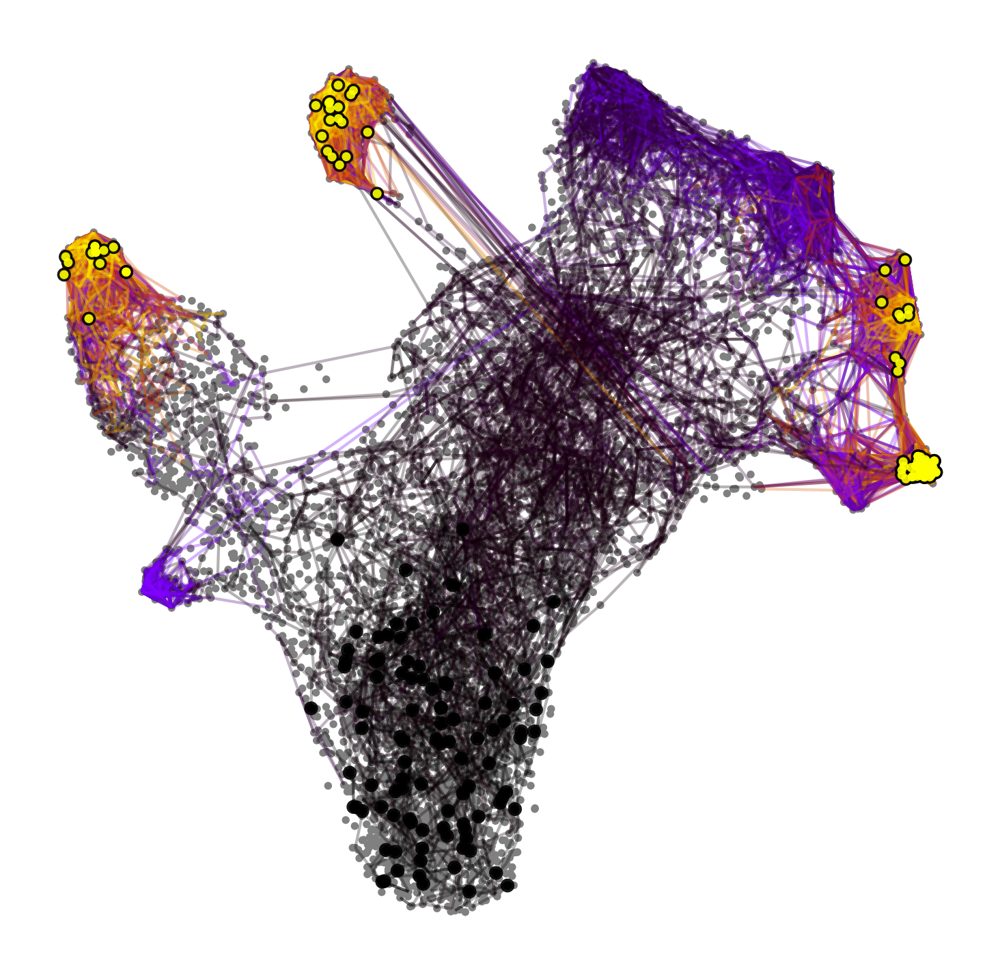

In [17]:
with mplscience.style_context():
    if SAVE_FIGURES:
        dpi = 400
        save = FIG_DIR / "pseudotimekernel" / "umap_rws.png"
    else:
        dpi = 150
        save = None
    ptk.plot_random_walks(
        start_ixs={"celltype": "HSC"}, basis="umap", seed=0, dpi=dpi, size=30, save=save, figsize=(6, 6)
    )

    plt.show()

Simulating `100` random walks of maximum length `1721`


  0%|          | 0/100 [00:00<?, ?sim/s]

    Finish (0:00:08)
Plotting random walks


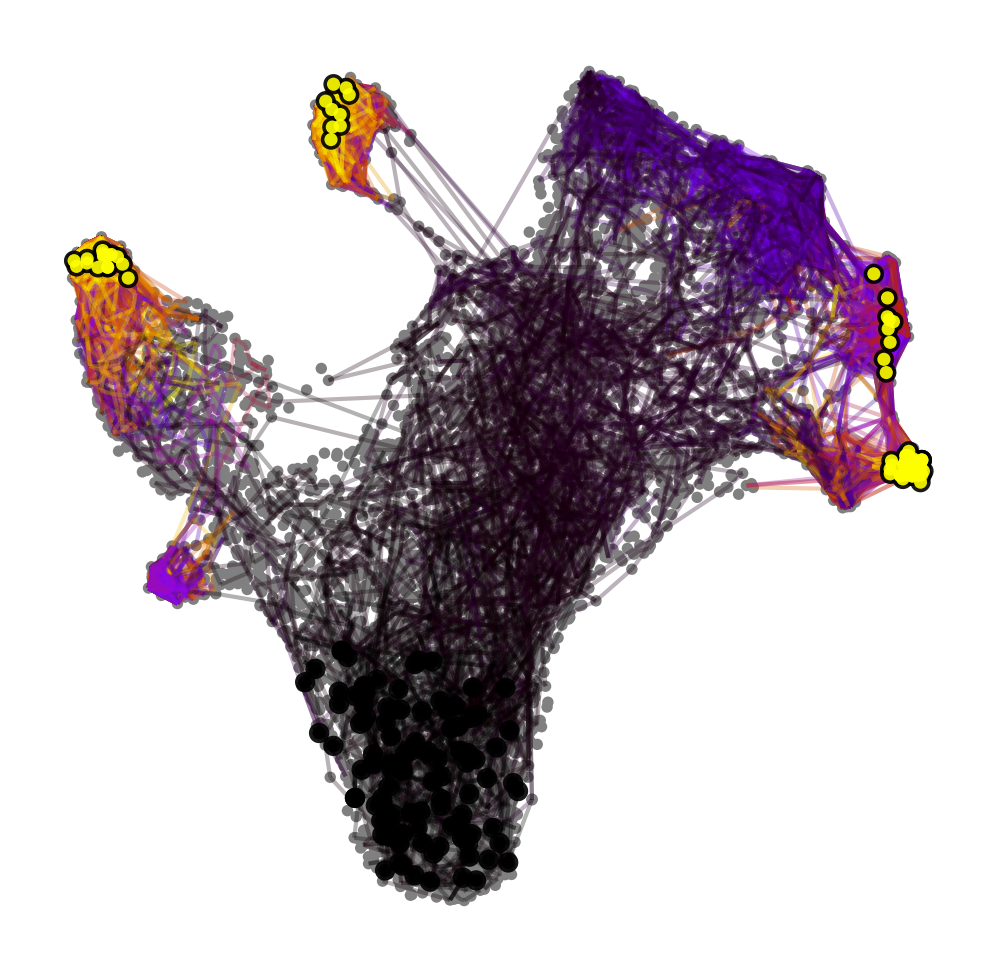

In [18]:
with mplscience.style_context():
    ptk.plot_random_walks(start_ixs={"palantir_pseudotime": [0, 0.1]}, basis="umap", seed=0, dpi=150, size=30)
    plt.show()

### Estimator

Computing Schur decomposition
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:03)


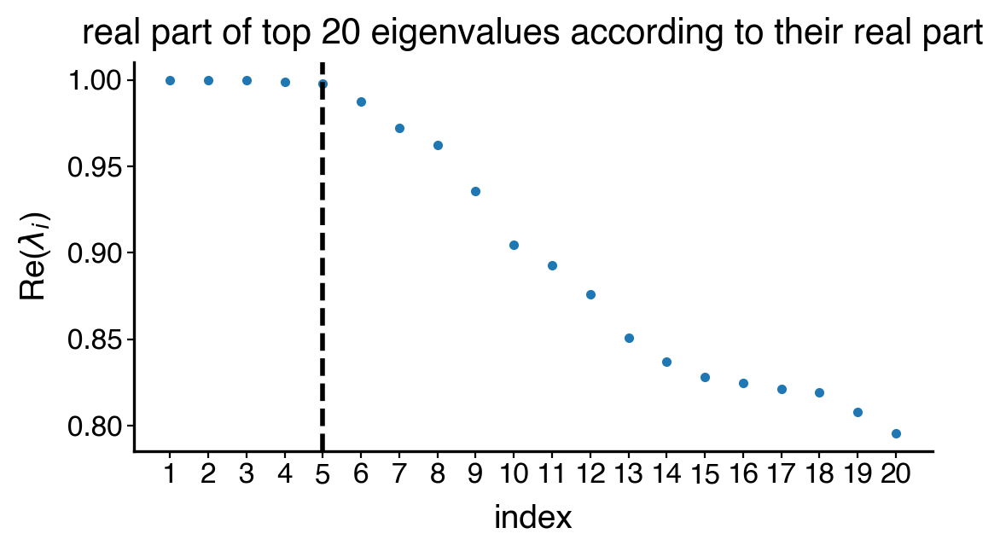

In [19]:
estimator = cr.estimators.GPCCA(ptk)
estimator.compute_schur()
with mplscience.style_context():
    if SAVE_FIGURES:
        save = FIG_DIR / "pseudotimekernel" / f"spectrum.{FIGURE_FORMAT}"
    else:
        save = False
    estimator.plot_spectrum(real_only=True, figsize=(6, 3), save=save)
    plt.show()

Computing `5` macrostates
DEBUG: Setting the macrostates using macrostates memberships
DEBUG: Raising an exception if there are less than `6` cells.
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)


/Users/philipp/miniforge3/envs/crp-py311/lib/python3.11/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/philipp/miniforge3/envs/crp-py311/lib/python3.11/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/philipp/miniforge3/envs/crp-py311/lib/python3.11/site-packages/scvelo/plotting/utils.py:1396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/Users/philipp/miniforge3/envs/crp-py311/lib/python3.11/site-packages/scvelo/plotting/utils.py:1397: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


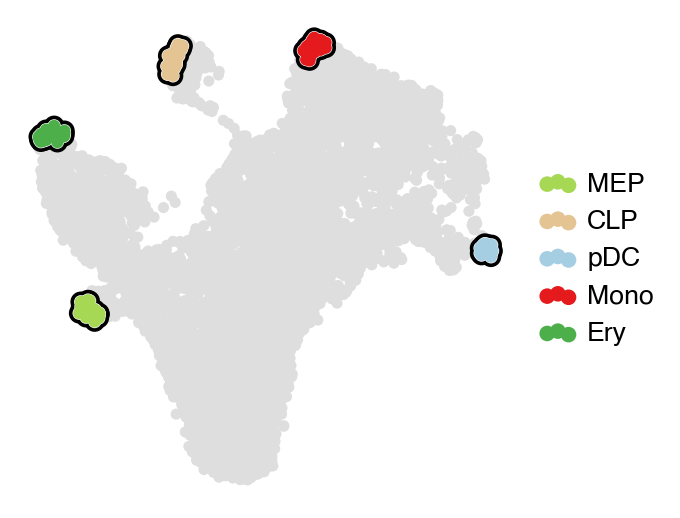

In [20]:
estimator.compute_macrostates(5, cluster_key="celltype")

with mplscience.style_context():
    estimator.plot_macrostates(which="all", basis="umap", legend_loc="right", title="", size=100)
    if SAVE_FIGURES:
        fig, ax = plt.subplots(figsize=(6, 6))
        estimator.plot_macrostates(which="all", basis="umap", legend_loc=False, title="", size=100, ax=ax)
        fig.savefig(
            FIG_DIR / "pseudotimekernel" / "5_macrostates.png",
            dpi=400,
            transparent=True,
            bbox_inches="tight",
        )
    plt.show()

In [21]:
cluster_key = "celltype"

tsi_score = estimator.tsi(n_macrostates=15, terminal_states=TERMINAL_STATES, cluster_key=cluster_key)
print(f"TSI score: {tsi_score:.2f}")

Computing `15` macrostates
DEBUG: Setting the macrostates using macrostates memberships
DEBUG: Raising an exception if there are less than `6` cells.
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:21)
Computing `14` macrostates
DEBUG: Setting the macrostates using macrostates memberships
DEBUG: Raising an exception if there are less than `6` cells.
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:14)
Computing `13` macrostates
DEBUG: Setting the macrostates using macrostates memberships
DEBUG: Raising an exception if there are less than `6` cells.
Adding `.macrostates`
       `.macrostates_members

/Users/philipp/miniforge3/envs/crp-py311/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


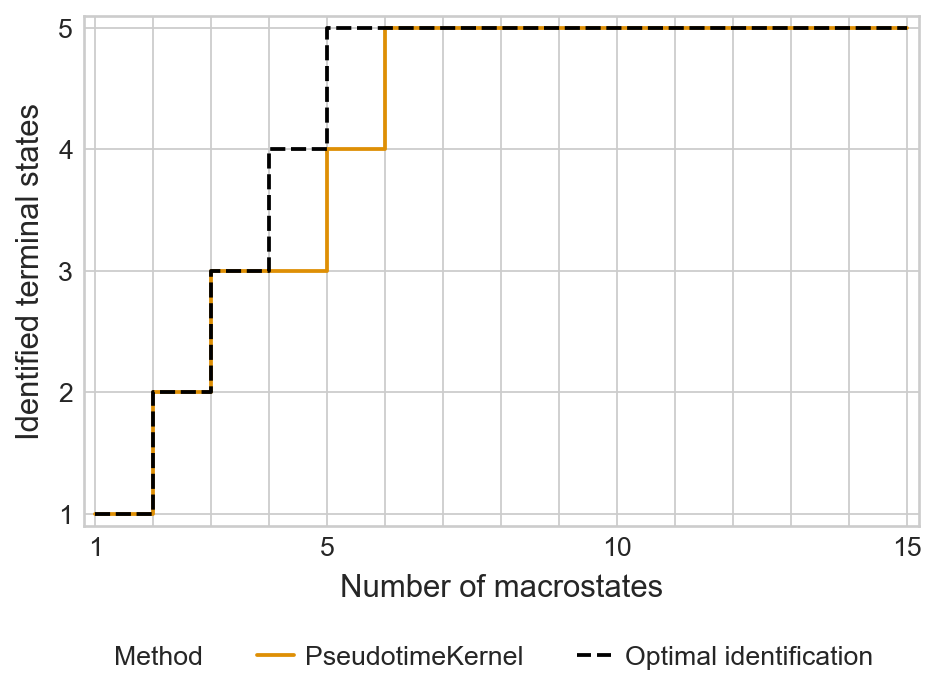

In [22]:
palette = {"PseudotimeKernel": "#DE8F05", "Optimal identification": "#000000"}

with mplscience.style_context():
    sns.set_style(style="whitegrid")
    estimator.plot_tsi(palette=palette)
    plt.show()

Computing `6` macrostates
DEBUG: Setting the macrostates using macrostates memberships
DEBUG: Raising an exception if there are less than `6` cells.
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)


/Users/philipp/miniforge3/envs/crp-py311/lib/python3.11/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/philipp/miniforge3/envs/crp-py311/lib/python3.11/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/philipp/miniforge3/envs/crp-py311/lib/python3.11/site-packages/scvelo/plotting/utils.py:1396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/Users/philipp/miniforge3/envs/crp-py311/lib/python3.11/site-packages/scvelo/plotting/utils.py:1397: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


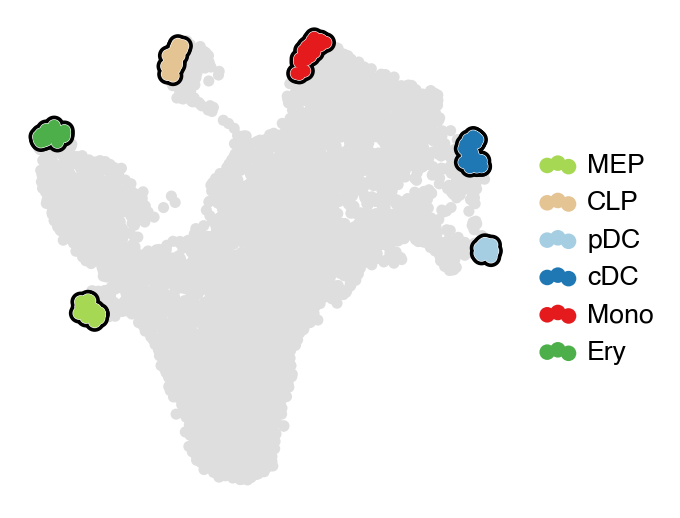

In [23]:
estimator.compute_macrostates(6, cluster_key="celltype")

with mplscience.style_context():
    estimator.plot_macrostates(which="all", basis="umap", legend_loc="right", title="", size=100)
    if SAVE_FIGURES:
        fig, ax = plt.subplots(figsize=(6, 6))
        estimator.plot_macrostates(which="all", basis="umap", legend_loc=False, title="", size=100, ax=ax)
        fig.savefig(
            FIG_DIR / "pseudotimekernel" / "6_macrostates.png",
            dpi=400,
            transparent=True,
            bbox_inches="tight",
        )
    plt.show()

DEBUG: Raising an exception if there are less than `6` cells.
Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


/Users/philipp/miniforge3/envs/crp-py311/lib/python3.11/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/philipp/miniforge3/envs/crp-py311/lib/python3.11/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/philipp/miniforge3/envs/crp-py311/lib/python3.11/site-packages/scvelo/plotting/utils.py:1396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/Users/philipp/miniforge3/envs/crp-py311/lib/python3.11/site-packages/scvelo/plotting/utils.py:1397: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


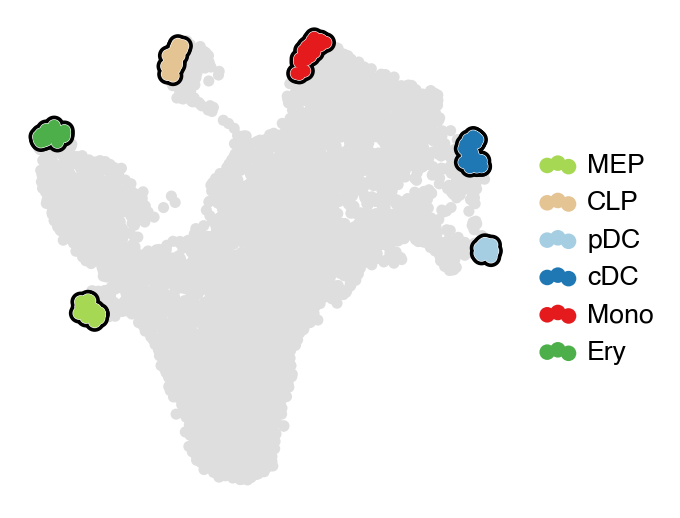

In [24]:
estimator.predict_terminal_states()
# estimator.set_terminal_states(TERMINAL_STATES)

with mplscience.style_context():
    estimator.plot_macrostates(which="terminal", basis="umap", legend_loc="right", title="", size=100)

    if SAVE_FIGURES:
        fig, ax = plt.subplots(figsize=(6, 6))
        estimator.plot_macrostates(which="terminal", basis="umap", legend_loc=False, title="", size=100, ax=ax)
        fig.savefig(
            FIG_DIR / "pseudotimekernel" / "terminal_states_inferred.png",
            dpi=400,
            transparent=True,
            bbox_inches="tight",
        )

    plt.show()

Computing fate probabilities
DEBUG: Solving the linear system using `PETSc` solver `'gmres'` on `1` core(s) with no preconditioner and `tol=1e-06`


  0%|          | 0/6 [00:00<?, ?/s]

Adding `adata.obsm['lineages_fwd']`
       `.fate_probabilities`
    Finish (0:00:00)


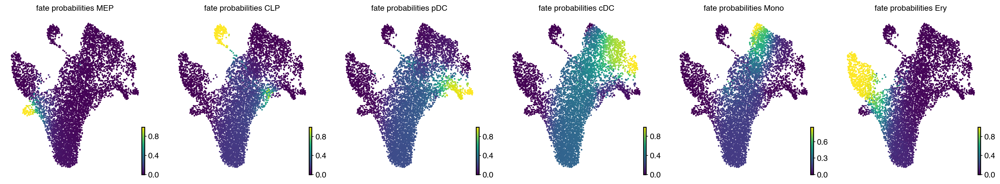

In [25]:
estimator.compute_fate_probabilities()
with mplscience.style_context():
    estimator.plot_fate_probabilities(same_plot=False, basis="umap", ncols=6)
    plt.show()

if SAVE_FIGURES:
    bdata = adata.copy()
    bdata.obs[estimator.fate_probabilities.names.tolist()] = estimator.fate_probabilities.X

    for lineage in estimator.fate_probabilities.names.tolist():
        with mplscience.style_context():
            fig, ax = plt.subplots(figsize=(6, 6))
            scv.pl.scatter(bdata, basis="umap", color=lineage, cmap="viridis", title="", colorbar=False, ax=ax)
            fig.savefig(
                FIG_DIR / "pseudotimekernel" / f"{lineage.lower()}_fate_terminal_pred.png",
                dpi=400,
                transparent=True,
                bbox_inches="tight",
            )
            plt.show()
    del bdata

DEBUG: Set ordering to `optimal`
Solving TSP for `6` states


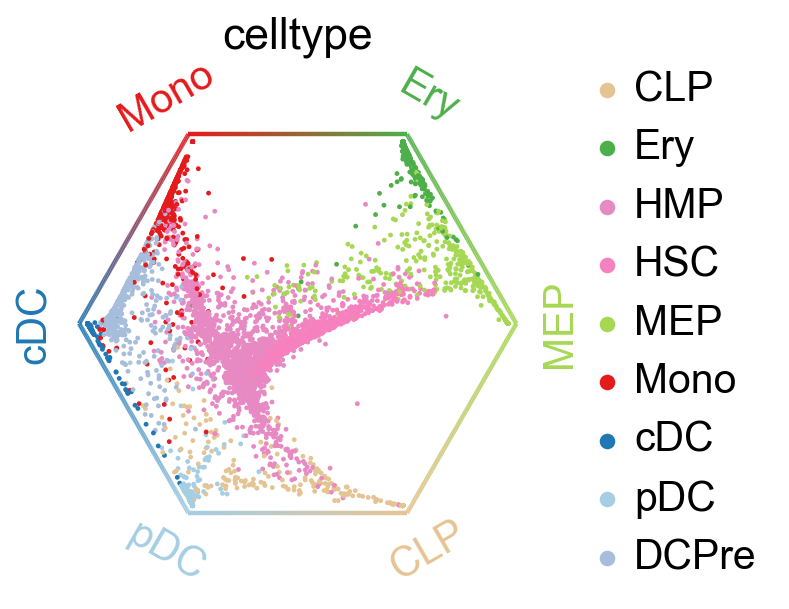

In [26]:
if SAVE_FIGURES:
    save = FIG_DIR / "pseudotimekernel" / f"circular_projection.{FIGURE_FORMAT}"
else:
    save = None

cr.pl.circular_projection(adata, keys=cluster_key, legend_loc="right", save=save)

DEBUG: Computing correlations for lineages `['MEP']` restricted to clusters `['HSC', 'MEP']` in layer `X` with `use_raw=False`
Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


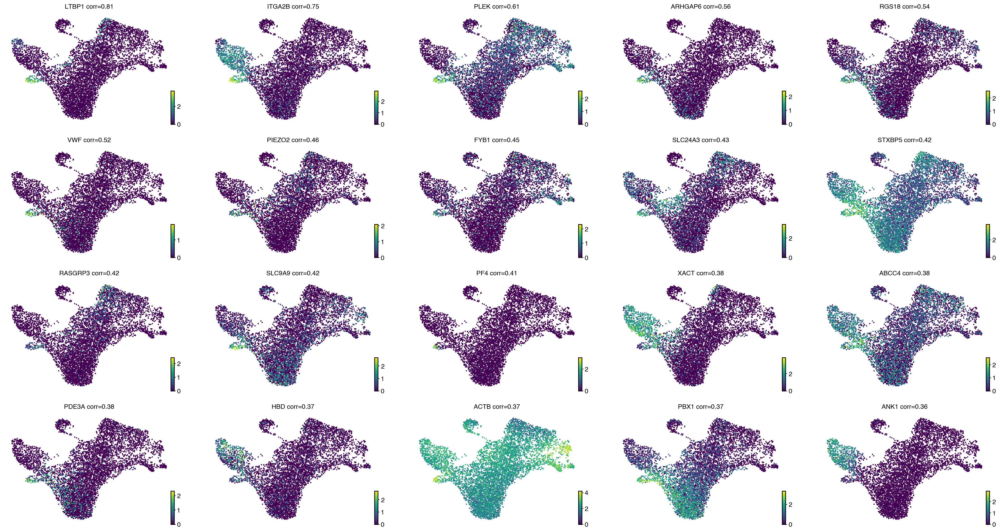

In [27]:
drivers = estimator.compute_lineage_drivers(
    return_drivers=True, cluster_key="celltype", lineages=["MEP"], clusters=["HSC", "MEP"]
)

with mplscience.style_context():
    estimator.plot_lineage_drivers(lineage="MEP", n_genes=20, ncols=5, title_fmt="{gene} corr={corr:.2}")
    plt.show()

In [28]:
gene_names = drivers.loc[
    ~(drivers.index.str.startswith(("MT.", "RPL", "RPS", "^HB[^(p)]")) | drivers.index.isin(S_GENES + G2M_GENES)),
    :,
].index

ranking = pd.DataFrame(drivers.loc[gene_names, "MEP_corr"])
ranking["ranking"] = np.arange(len(gene_names))

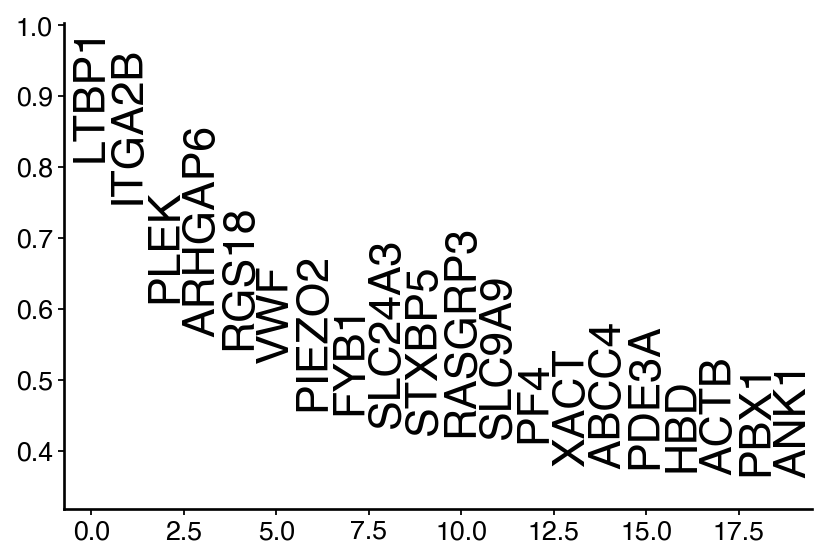

In [29]:
df = ranking.iloc[:20, :]

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    y_min = np.min(df["MEP_corr"])
    y_max = np.max(df["MEP_corr"])

    y_min -= 0.1 * (y_max - y_min)
    y_max += 0.4 * (y_max - y_min)
    ax.set_ylim(y_min, y_max)

    ax.set_xlim(-0.75, 19.5)

    for gene in df.index:
        color = "#000000"
        ax.text(
            df.loc[gene, "ranking"],
            df.loc[gene, "MEP_corr"],
            gene,
            rotation="vertical",
            verticalalignment="bottom",
            horizontalalignment="center",
            fontsize=20,
            color=color,
        )

    if SAVE_FIGURES:
        ax.set(xticks=[], xticklabels=[])
        fig.savefig(
            FIG_DIR / "pseudotimekernel" / f"putative_drivers.{FIGURE_FORMAT}",
            format=FIGURE_FORMAT,
            transparent=True,
            bbox_inches="tight",
        )
    plt.show()

ITGA2B: https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0043300, https://pmc.ncbi.nlm.nih.gov/articles/PMC7217381/, https://www.sciencedirect.com/science/article/pii/S1538783623003215
VWF: https://pmc.ncbi.nlm.nih.gov/articles/PMC7217381/
PLEK: https://www.sciencedirect.com/science/article/pii/S1097276520302343

RGS18: https://pmc.ncbi.nlm.nih.gov/articles/PMC1222126/, https://pubmed.ncbi.nlm.nih.gov/25405900/
PIEZO2: https://pmc.ncbi.nlm.nih.gov/articles/PMC5803306/

SLC24A3: https://pmc.ncbi.nlm.nih.gov/articles/PMC2225987/ (platlet = meg derived)
STXBP5: https://www.sciencedirect.com/science/article/pii/S1538783623003215

Double check
ARHGAP6: https://pmc.ncbi.nlm.nih.gov/articles/PMC6199649/

Computing trends using `1` core(s)


  0%|          | 0/5 [00:00<?, ?gene/s]

    Finish (0:00:00)
Plotting trends
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`. Ignoring`
DEBUG: Key `None` not found in `adata.obs` or `adata.var_names`

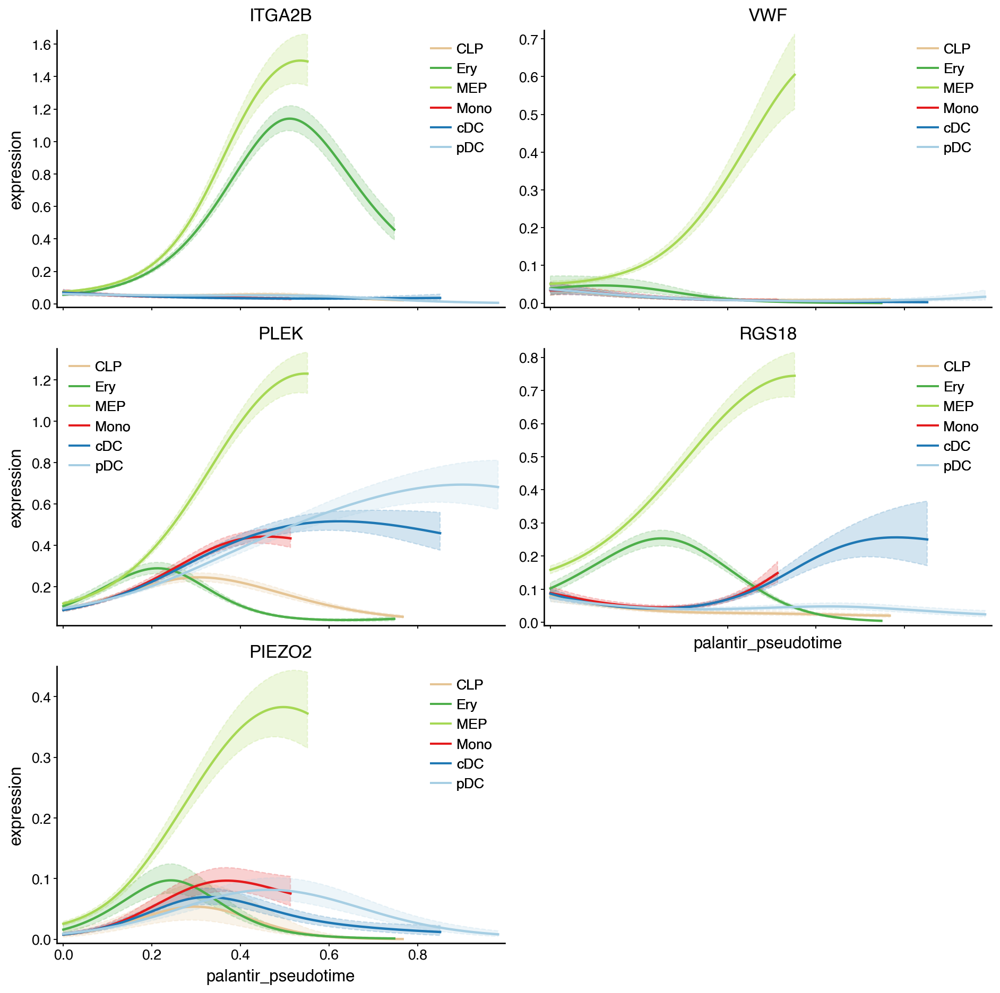

In [30]:
model = cr.models.GAM(adata)

with mplscience.style_context():
    cr.pl.gene_trends(
        adata,
        model=model,
        genes=["ITGA2B", "VWF", "PLEK", "RGS18", "PIEZO2"],
        time_key="palantir_pseudotime",
        hide_cells=True,
        same_plot=True,
    )
    plt.show()

if SAVE_FIGURES:
    fig = cr.pl.gene_trends(
        adata,
        model=model,
        genes=["ITGA2B", "VWF"],
        time_key="palantir_pseudotime",
        hide_cells=True,
        same_plot=True,
        figsize=(8, 4),
        sharey=True,
        return_figure=True,
        # lineage_cmap=["#8e063b", "#f0b98d", "#d5eae7", "#f3e1eb"],
    )

    fig.savefig(
        FIG_DIR / "pseudotimekernel" / f"gene_trends.{FIGURE_FORMAT}",
        format=FIGURE_FORMAT,
        transparent=True,
        bbox_inches="tight",
    )

DEBUG: Raising an exception if there are less than `6` cells.
Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


/Users/philipp/miniforge3/envs/crp-py311/lib/python3.11/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/philipp/miniforge3/envs/crp-py311/lib/python3.11/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/philipp/miniforge3/envs/crp-py311/lib/python3.11/site-packages/scvelo/plotting/utils.py:1396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/Users/philipp/miniforge3/envs/crp-py311/lib/python3.11/site-packages/scvelo/plotting/utils.py:1397: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


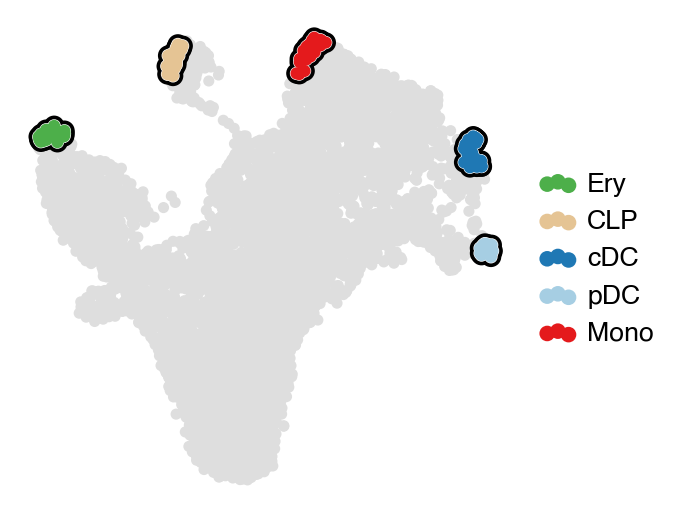

In [31]:
estimator.set_terminal_states(TERMINAL_STATES)

with mplscience.style_context():
    estimator.plot_macrostates(which="terminal", basis="umap", legend_loc="right", title="", size=100)

    if SAVE_FIGURES:
        fig, ax = plt.subplots(figsize=(6, 6))
        estimator.plot_macrostates(which="terminal", basis="umap", legend_loc=False, title="", size=100, ax=ax)
        fig.savefig(
            FIG_DIR / "pseudotimekernel" / "terminal_states_set.png",
            dpi=400,
            transparent=True,
            bbox_inches="tight",
        )

    plt.show()

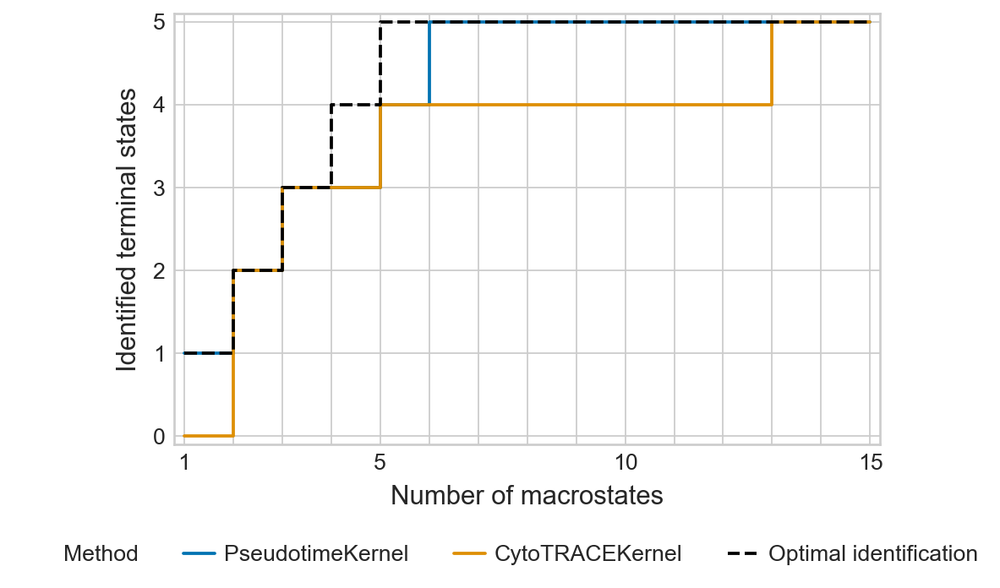

In [32]:
ptk_tsi = estimator._tsi.to_df()
ct_tsi = pd.read_parquet(DATA_DIR / "bone_marrow" / "results" / "ct_tsi.parquet")

ptk_tsi["method"] = "PseudotimeKernel"
ct_tsi["method"] = "CytoTRACEKernel"

df = pd.concat([ptk_tsi, ct_tsi])

palette = {"PseudotimeKernel": "#0173B2", "CytoTRACEKernel": "#DE8F05", "Optimal identification": "#000000"}

if SAVE_FIGURES:
    fname = FIG_DIR / "pseudotimekernel" / f"tsi_ranking.{FIGURE_FORMAT}"
else:
    fname = None

with mplscience.style_context():
    sns.set_style(style="whitegrid")
    plot_tsi(df=df, n_macrostates=15, palette=palette, fname=fname)
    plt.show()

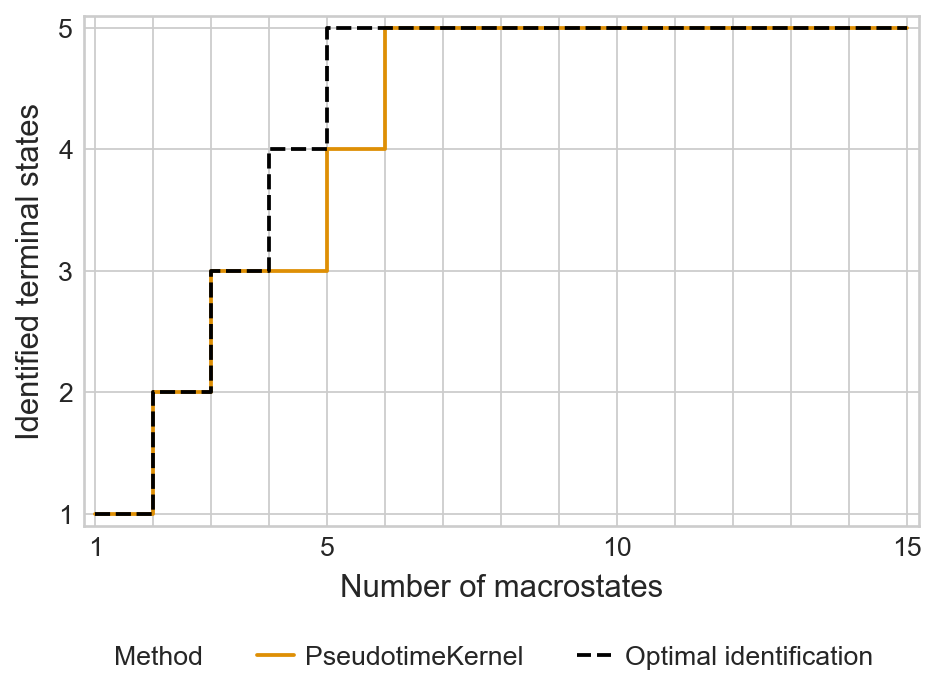

In [33]:
palette = {"PseudotimeKernel": "#DE8F05", "CytoTRACEKernel": "#DE8F05", "Optimal identification": "#000000"}

with mplscience.style_context():
    sns.set_style(style="whitegrid")
    estimator.plot_tsi(palette=palette)
    plt.show()

Computing fate probabilities
DEBUG: Solving the linear system using `PETSc` solver `'gmres'` on `1` core(s) with no preconditioner and `tol=1e-06`


  0%|          | 0/5 [00:00<?, ?/s]

Adding `adata.obsm['lineages_fwd']`
       `.fate_probabilities`
    Finish (0:00:00)


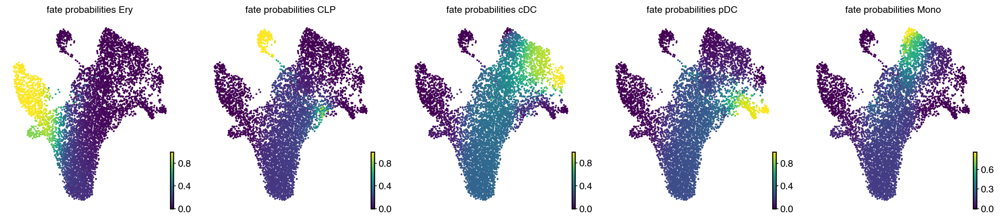

In [34]:
estimator.compute_fate_probabilities()
with mplscience.style_context():
    estimator.plot_fate_probabilities(same_plot=False, basis="umap", ncols=5)
    plt.show()

if SAVE_FIGURES:
    bdata = adata.copy()
    bdata.obs[estimator.fate_probabilities.names.tolist()] = estimator.fate_probabilities.X

    for lineage in estimator.fate_probabilities.names.tolist():
        with mplscience.style_context():
            fig, ax = plt.subplots(figsize=(6, 6))
            scv.pl.scatter(bdata, basis="umap", color=lineage, cmap="viridis", title="", colorbar=False, ax=ax)
            fig.savefig(
                FIG_DIR / "pseudotimekernel" / f"{lineage.lower()}_fate_terminal_set.png",
                dpi=400,
                transparent=True,
                bbox_inches="tight",
            )
            plt.show()
    del bdata

In [35]:
cluster_key = "celltype"
rep = "X_pca"

ptk_cbc = []
for source, target in tqdm(STATE_TRANSITIONS):
    _cbc = ptk.cbc(source=source, target=target, cluster_key=cluster_key, rep=rep)

    ptk_cbc.append(
        pd.DataFrame(
            {
                "state_transition": [f"{source} - {target}"] * len(_cbc),
                "cbc": _cbc,
            }
        )
    )
ptk_cbc = pd.concat(ptk_cbc)

if SAVE_RESULTS:
    ptk_cbc.to_parquet(DATA_DIR / "bone_marrow" / "results" / "palantir_cbc.parquet")

ptk_cbc.head()

100%|██████████| 8/8 [00:00<00:00, 12.67it/s]


,state_transition,cbc
0,HSC - MEP,0.682481
1,HSC - MEP,0.612722
2,HSC - MEP,0.715823
3,HSC - MEP,0.520870
4,HSC - MEP,0.850975


In [36]:
ctk_cbc = pd.read_parquet(DATA_DIR / "bone_marrow" / "results" / "ct_cbc.parquet")
cbc_ratio = pd.DataFrame(
    {"Log ratio": np.log((ptk_cbc["cbc"] + 1) / (ctk_cbc["cbc"] + 1)), "State transition": ptk_cbc["state_transition"]}
)

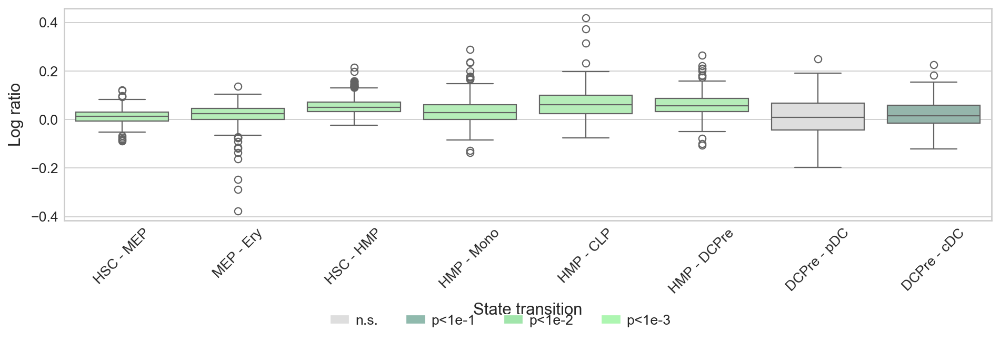

In [37]:
ttest_res, significances = get_ttest_res(cbc_ratio)
palette = get_palette(significances=significances)

if SAVE_FIGURES:
    fpath = FIG_DIR / "pseudotimekernel" / "cbc_ratio.svg"
else:
    fpath = None
plot_cbc_ratio(cbc=cbc_ratio, palette=palette, figsize=(12, 4), fpath=fpath)